# Full Pipeline

## Imports

In [ ]:
import os
import cv2
import torch
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
import torchvision.transforms.v2 as T
from collections import defaultdict

pl.seed_everything(23)
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

MEAN = torch.tensor([0.485, 0.456, 0.406])
STD = torch.tensor([0.229, 0.224, 0.225])

def denormalize(tensor):
    m = MEAN.view(3, 1, 1).to(tensor.device)
    s = STD.view(3, 1, 1).to(tensor.device)
    return torch.clamp(tensor * s + m, 0, 1)

Seed set to 23


## Models

In [ ]:
class FenceSegmentationLightning(pl.LightningModule):
    def __init__(self, learning_rate=3e-4):
        super().__init__()
        self.model = smp.Unet(encoder_name="resnet50", encoder_weights="imagenet", in_channels=3, classes=1)

    def forward(self, x):
        return self.model(x)

class LightningModuleInpainting(pl.LightningModule):
    def __init__(self, learning_rate=3e-4):
        super().__init__()
        # Entrada de 4 canales: RGB (3) + Mask (1)
        self.model = smp.Unet(encoder_name='resnet50', encoder_weights='imagenet', in_channels=4, classes=3)
        
    def forward(self, x):
        return self.model(x)

## Dataset

In [ ]:
class FenceInferenceDataset(Dataset):
    def __init__(self, images_dir, labels_dir, transforms=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.transforms = transforms
        self.image_files = sorted([f for f in os.listdir(images_dir) if f.lower().endswith(".jpg")])

    def __len__(self): return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        base = os.path.splitext(img_name)[0]
        image = Image.open(os.path.join(self.images_dir, img_name)).convert("RGB")
        mask = Image.open(os.path.join(self.labels_dir, base + ".png")).convert("L")

        if self.transforms:
            image, mask = self.transforms(image, mask)
        
        return {"image": image, "mask": (mask > 0.5).float(), "filename": img_name}

val_transforms = T.Compose([
    T.Resize(256, antialias=True),
    T.CenterCrop(224),
    T.ToImage(),
    T.ToDtype(torch.float32, scale=True),
    T.Normalize(mean=MEAN.tolist(), std=STD.tolist()),
])

val_dataset = FenceInferenceDataset(
    images_dir="dataset/Test Set/Test_Images",
    labels_dir="dataset/Test Set/Test_Labels",
    transforms=val_transforms
)

## Pipeline

In [ ]:
class FenceRemovalPipeline:
    def __init__(self, seg_ckpt, inp_ckpt):
        self.seg_model = FenceSegmentationLightning.load_from_checkpoint(seg_ckpt).to(DEVICE).eval()
        self.inp_model = LightningModuleInpainting.load_from_checkpoint(inp_ckpt).to(DEVICE).eval()

    def process(self, image_tensor, dilation_k=5):
        """
        image_tensor: [1, 3, 224, 224] normalizado
        """
        with torch.no_grad():
            logits = self.seg_model(image_tensor)
            raw_mask = (torch.sigmoid(logits) > 0.5).float()
            
            mask_np = raw_mask.squeeze().cpu().numpy()
            kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (dilation_k, dilation_k))
            dilated_np = cv2.dilate(mask_np, kernel, iterations=1)
            dilated_mask = torch.from_numpy(dilated_np).unsqueeze(0).unsqueeze(0).to(DEVICE)
            
            masked_img = image_tensor * (1 - dilated_mask)
            inp_input = torch.cat([masked_img, dilated_mask], dim=1)
            prediction = self.inp_model(inp_input)
            
            final_output = image_tensor * (1 - dilated_mask) + prediction * dilated_mask
            
        return final_output, dilated_mask, raw_mask

pipeline = FenceRemovalPipeline(
    seg_ckpt="checkpoints/defence_model.ckpt",
    inp_ckpt="checkpoints/augmentation_mask_mix.ckpt"
)

## Visualize Results

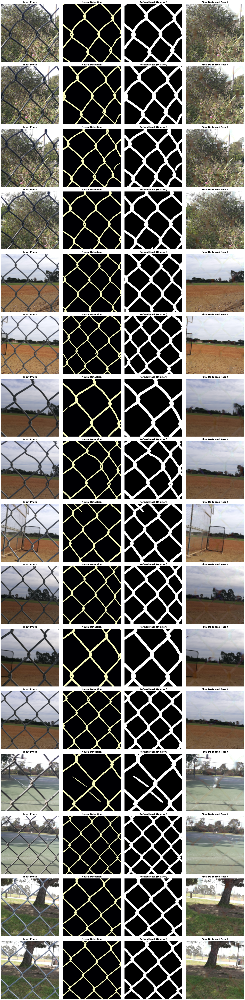

In [ ]:
def visualize_paper_results(pipeline, dataset, num_images=5):
    fig, axes = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))
    
    for i in range(num_images):
        sample = dataset[i]
        img_t = sample["image"].unsqueeze(0).to(DEVICE)
        
        final_t, dilated_mask, raw_mask = pipeline.process(img_t, dilation_k=5)
        
        img_orig = denormalize(img_t[0]).cpu().permute(1, 2, 0).numpy()
        mask_det = raw_mask[0, 0].cpu().numpy()
        mask_dil = dilated_mask[0, 0].cpu().numpy()
        img_final = denormalize(final_t[0]).cpu().permute(1, 2, 0).numpy()
        
        axes[i, 0].imshow(img_orig)
        axes[i, 0].set_title("Input Photo", fontweight='bold')
        
        axes[i, 1].imshow(mask_det, cmap='magma')
        axes[i, 1].set_title("Neural Detection", fontweight='bold')
        
        axes[i, 2].imshow(mask_dil, cmap='gray')
        axes[i, 2].set_title("Refined Mask (Dilation)", fontweight='bold')
        
        axes[i, 3].imshow(img_final)
        axes[i, 3].set_title("Final De-fenced Result", fontweight='bold')
        
        for ax in axes[i]: ax.axis('off')

    plt.tight_layout()
    plt.savefig("paper_results_comparison.png", dpi=300)
    plt.show()

visualize_paper_results(pipeline, val_dataset, num_images=16)